# Faster R-CNN

- 데이터는 roboflow 사용
- 방법1, 방법2 두가지로 구현
- 최종결과 확인 및 정리


- 사용할 데이터셋 (https://public.roboflow.com/object-detection/mask-wearing)



&nbsp;

## 작업위치 설정

In [ ]:
import os

os.mkdir('fast_rcnn')
os.chdir('fast_rcnn')

&nbsp;

## mmdetection 설치 (colab 기본 pytorch 버전과 맞춘것)

In [ ]:
import torch

torch.__version__

'1.13.1+cu116'

In [ ]:
!pip install -U openmim
!mim install mmcv-full

!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -r requirements/build.txt
!pip install -v -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 KB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.0/239.0 KB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 67.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 12.3 MB/s eta 0:00:00
  Attempting uninstall: pygments
    Found existing installation: Pygments 2.6.1
    Uninstalling Pygments-2.6.1:
      Successfully uninstalled Pygments-2.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.9.0 requires jedi>=0.10, which is not installed.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu116/torch1.13.0/index.html

&nbsp;

## 데이터셋 다운

- roboflow 에서는 원하는 데이터셋 코드 다운도 지원

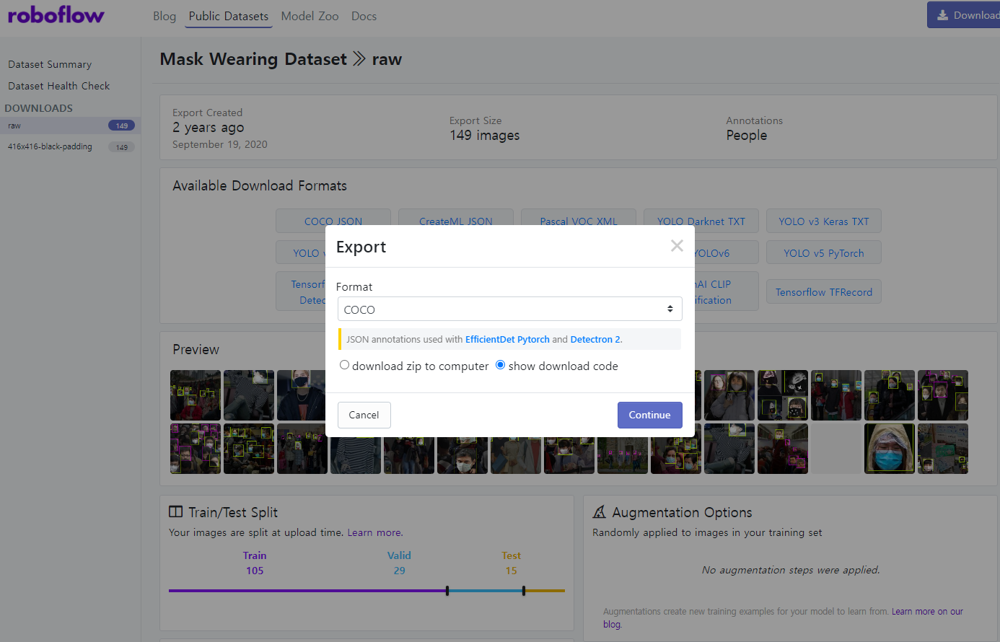

&nbsp;

- 폴더 생성및 데이터 다운

In [ ]:
os.mkdir('data')
os.chdir('data')
!curl -L "https://public.roboflow.com/ds/NyfU3VG4Vv?key=4el7nxVvoP" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0   3685      0 --:--:-- --:--:-- --:--:--  3685
100 18.7M  100 18.7M    0     0  12.4M      0  0:00:01  0:00:01 --:--:-- 21.6M
Archive:  roboflow.zip
 extracting: test/w1240-p16x9-2019-10-04t075956z_1862636027_rc15d4d49d00_rtrmadp_3_hongkong-protests_jpg.rf.a9a2c2a1cb13c980b339065d2324ea7d.jpg  
 extracting: train/11893820-3x2-xlarge_jpg.rf.1529b09bfee7d069f677ff513f6249eb.jpg  
 extracting: train/130624011830-malaysia-smog-students-horizontal-large-gallery_jpg.rf.1d1478ec7b2667aa240401f636d513c4.jpg  
 extracting: test/126202-untitled-design-13_jpg.rf.baa3d2e55d469ae5d5d4cd81c4603e1d.jpg  
 extracting: test/r1p00017o8171pnq407_jpg.rf.d21dd91220d3df7763f7d572f3d95863.jpg  
 extracting: test/15391513329330sooq10859_jpg.rf.bf9e791012521a572a3a7f2979d0dffe.jpg  
 extracting: train/1125506397_15801322206

In [ ]:
os.listdir()

['test', 'train', 'valid', 'README.roboflow.txt', 'README.dataset.txt']

&nbsp;

## Faster R-CNN

- mmdetection/configs 안에 _ custom _ 폴더 생성
- mmdetection 밑에 checkpoint 폴더 생성

In [ ]:
os.mkdir('/content/fast_rcnn/mmdetection/checkpoint/')
os.chdir('/content/fast_rcnn/mmdetection/checkpoint/')

from requests import get

def download(url, file_name):
    with open(file_name, "wb") as file:
        response = get(url)
        file.write(response.content)


url = "https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth"
download(url,"faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth")

### 방법 1. custom.py 사용

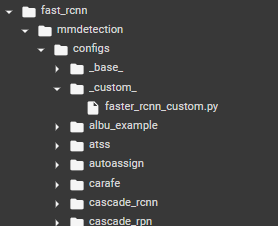


- faster_rcnn_custom.py

```python

_base_ = '../faster_rcnn/faster_rcnn_r50_fpn_1x_coco.py'


model = dict(
  roi_head = dict(
    bbox_head = dict(
      num_classes = 3
    )
  )
)


data_root = '/data'
classes = ('People', 'mask', 'no-mask',)


data = dict(
    samples_per_gpu=1,
    workers_per_gpu=0,

    train=dict(
      img_prefix="/train/",
      classes = classes,
      ann_file="/train/_annotations.coco.json"
),

    val=dict(
        img_prefix="/valid/",
        classes = classes,
        ann_file="/valid/_annotations.coco.json"
),

    test=dict(
        img_prefix="/test/",
        classes = classes,
        ann_file="/test/_annotations.coco.json"
)
)


runner = dict(type='EpochBasedRunner', max_epochs=5)
auto_scale_lr = dict(enable=False, base_batch_size=16)
checkpoint_config = dict(interval=1,out_dir='work_dirs/faster_rcnn/')
evaluation = dict(interval=1, metric='bbox')
load_from = 'checkpoint/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'

```

In [ ]:
os.chdir('/content/fast_rcnn/mmdetection/')

In [ ]:
# 100 epoch 수행하는 것
!python ./tools/train.py configs/_custom_/faster_rcnn_custom.py --work-dir configs/custom/faster_rcnn/

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
2023-02-18 03:36:04,092 - mmdet - INFO - Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.8.10 (default, Nov 14 2022, 12:59:47) [GCC 9.4.0]
CUDA available: True
GPU 0: Tesla T4
CUDA_HOME: /usr/local/cuda
NVCC: Cuda compilation tools, release 11.6, V11.6.124
GCC: x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
PyTorch: 1.13.1+cu116
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 ar

- 결과 이미지 확인

In [ ]:
!python ./tools/test.py configs/_custom_/faster_rcnn_custom.py work_dirs/faster_rcnn/faster_rcnn/latest.pth --format-only --eval-options 'jsonfile_prefix=./test_results'

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
load checkpoint from local path: work_dirs/faster_rcnn/faster_rcnn/latest.pth
[>>] 15/15, 4.1 task/s, elapsed: 4s, ETA:     0s

In [ ]:
!zip -r ./data.zip ./data

  adding: data/ (stored 0%)
  adding: data/test/ (stored 0%)
  adding: data/test/1579924271_jpg.rf.1fea0f43731fbea2876f63135256004f.jpg (deflated 1%)
  adding: data/test/RTX7CCFN_jpg.rf.501a9e3af09662fc1fbd288a32904267.jpg (deflated 20%)
  adding: data/test/r1p00017o8171pnq407_jpg.rf.d21dd91220d3df7763f7d572f3d95863.jpg (deflated 0%)
  adding: data/test/1224331650_g_400-w_g_jpg.rf.483a35a2395bf48e96783587a59fe876.jpg (deflated 1%)
  adding: data/test/w1240-p16x9-0e48e0098f6e832f27d8b581b33bbc72b9967a63_jpg.rf.b94576bb6f17f4efb5f582ffd9cf9077.jpg (deflated 3%)
  adding: data/test/126202-untitled-design-13_jpg.rf.baa3d2e55d469ae5d5d4cd81c4603e1d.jpg (deflated 3%)
  adding: data/test/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.5633f5fe7a9b926101b7fc16615dfb6a.jpg (deflated 0%)
  adding: data/test/1288126-10255706714jpg_jpg.rf.ed230c79fdbb1fa0650ff4fd32f620ee.jpg (deflated 1%)
  adding: data/test/phplpE73q_jpg.rf.0ab5de066db2a3791b039388014565fe.jpg (deflated 0%)
  adding: data/test

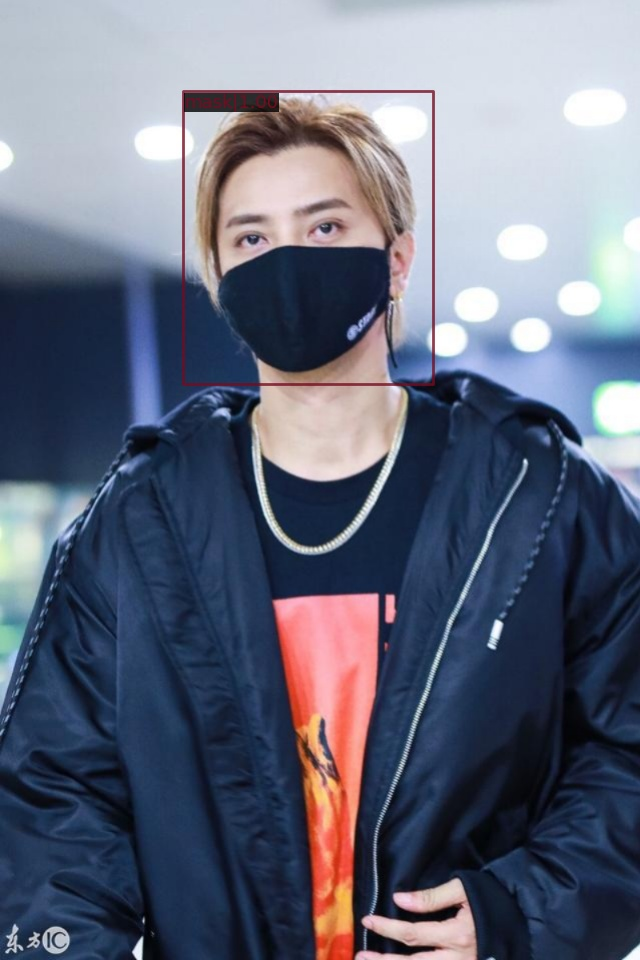

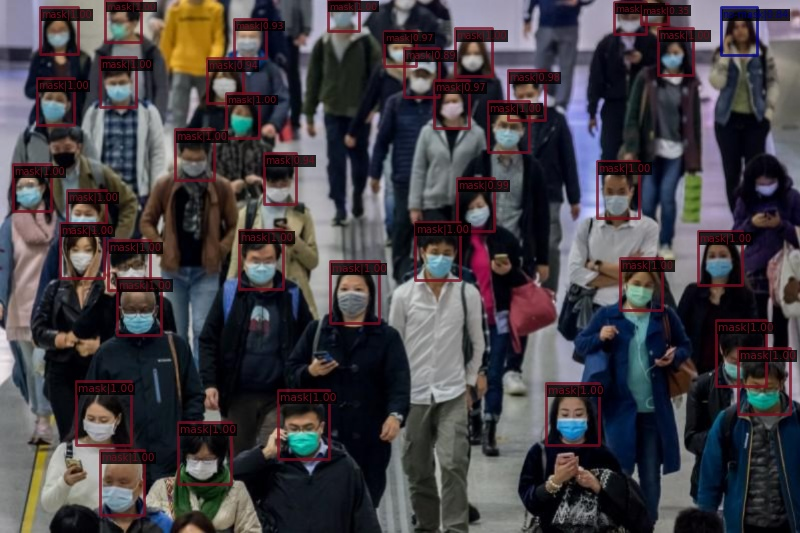

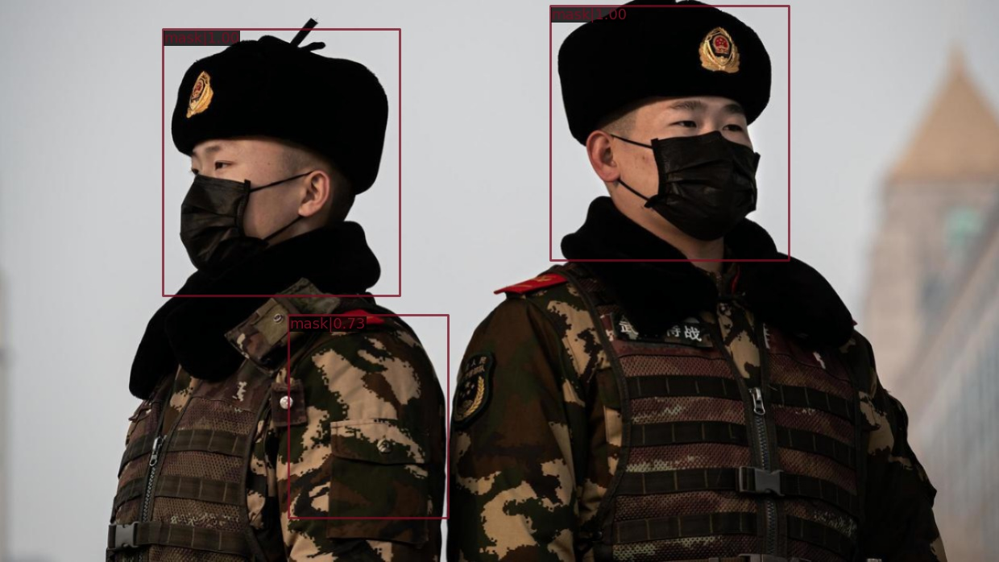

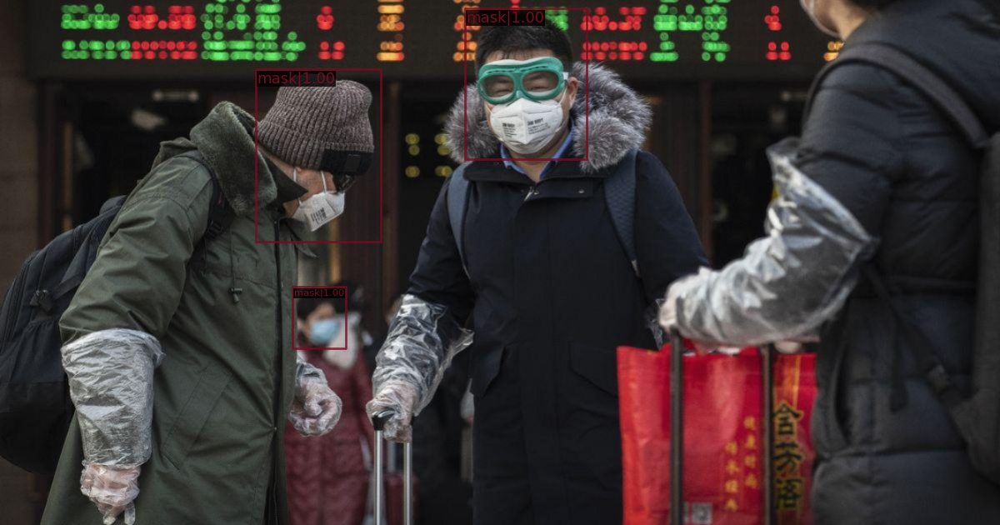

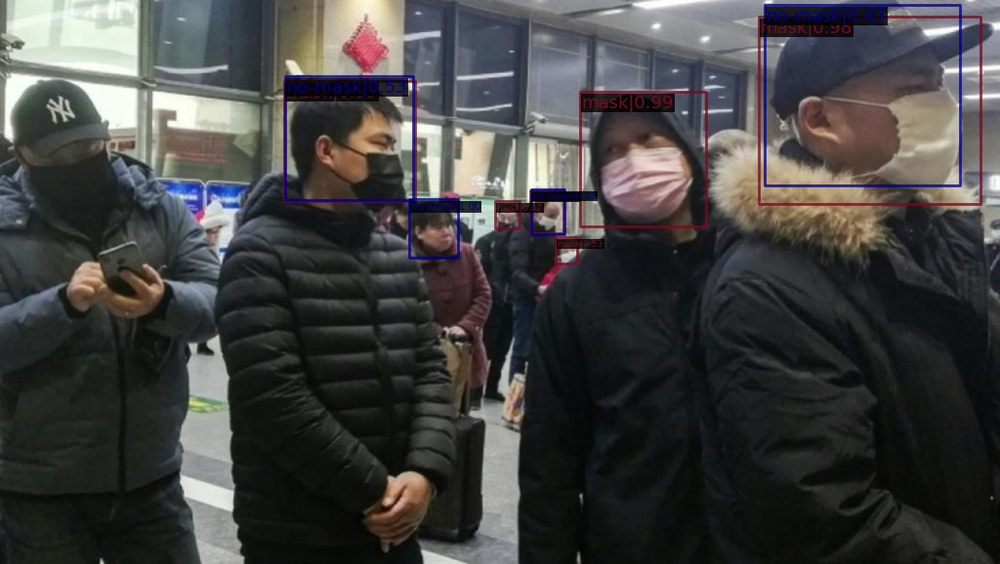

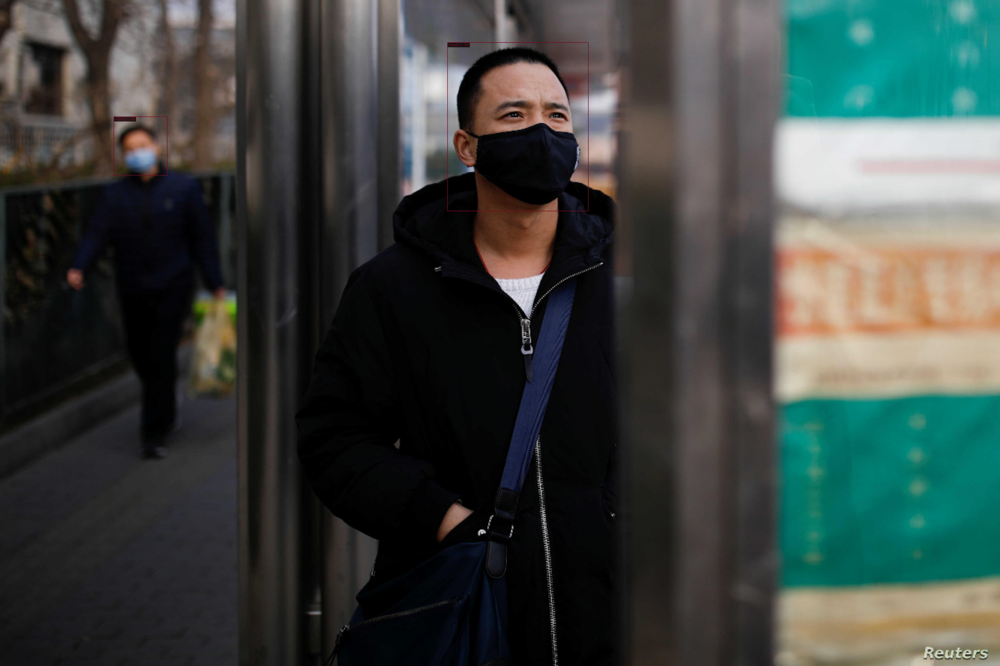

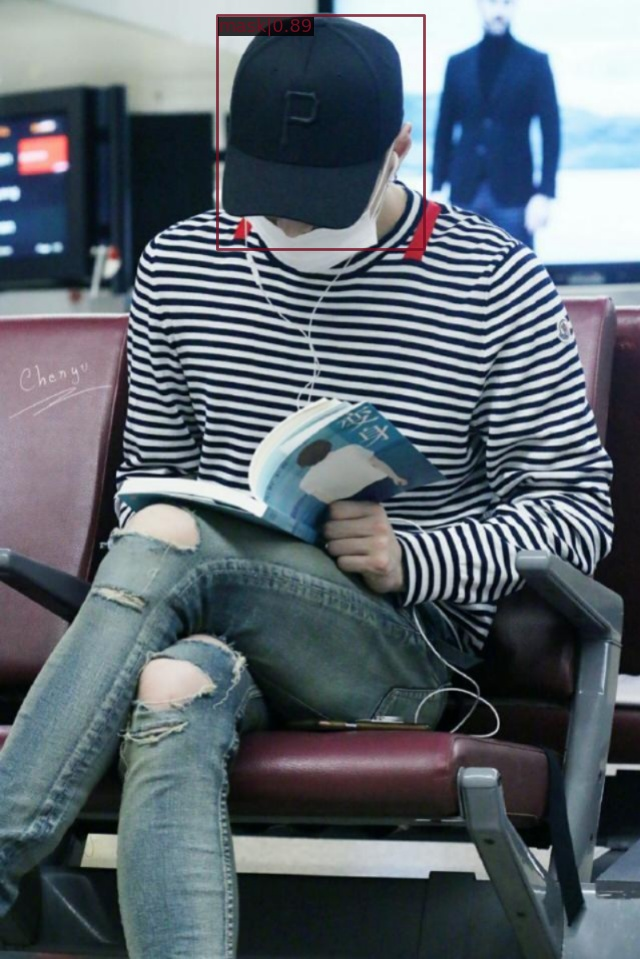

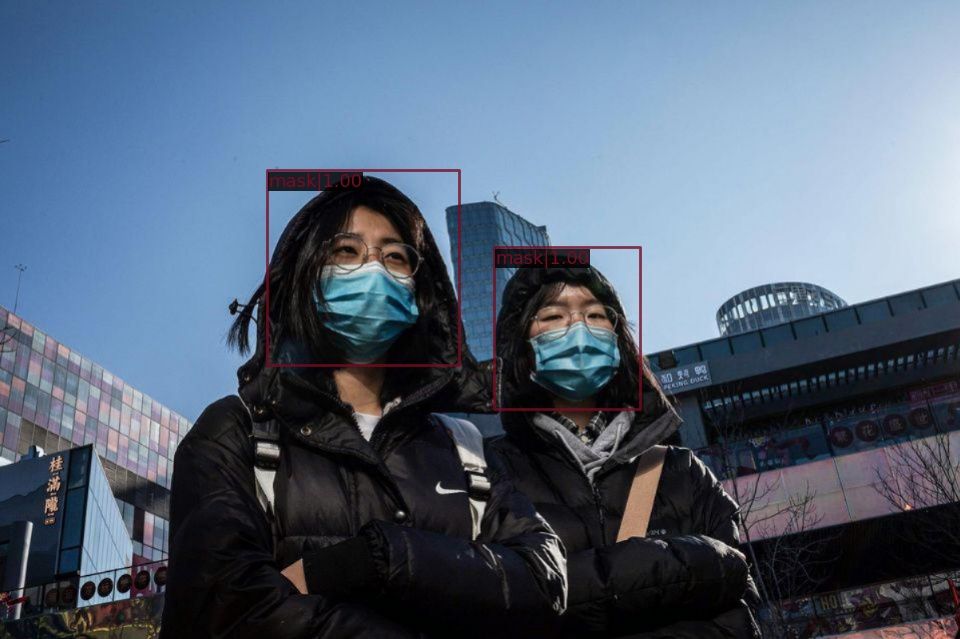

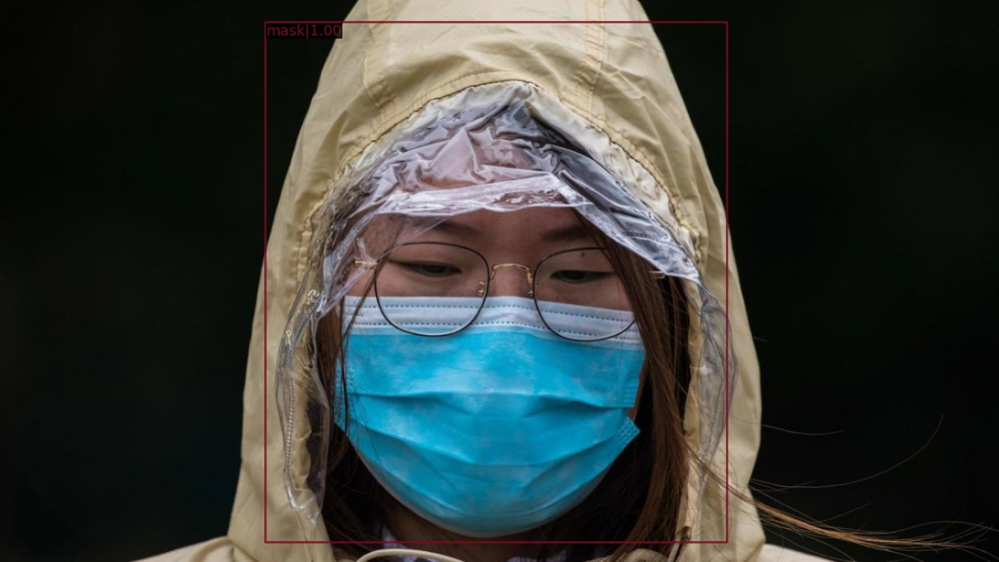

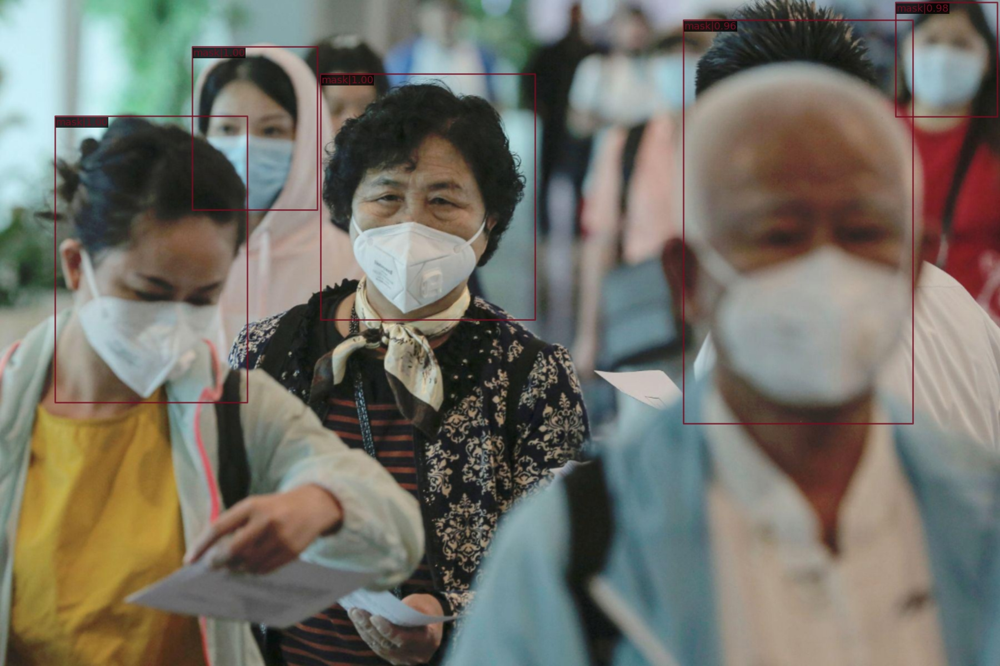

In [ ]:
from glob import glob
import cv2
from google.colab.patches import cv2_imshow

data_list = glob('./results/mask/*.jpg')
for i in data_list[:10]:
  src = cv2.imread(i)

  cv2_imshow(src)

### 방법 2. config 사용

In [ ]:
os.chdir('/content/fast_rcnn/mmdetection/')

In [ ]:
import mmcv
from mmcv.runner import load_checkpoint
from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector
from mmdet.apis import set_random_seed

# 사용할 모데 초기 py 설정
config = './configs/faster_rcnn/faster_rcnn_r50_fpn_1x_coco.py'

# config 불러오기
cfg = mmcv.Config.fromfile(config)

# 데이터셋 지정
cfg.dataset_type = 'CocoDataset'

# data_root는 사용자가 저장한 데이터가 있는 폴더 전까지
data_root = '/content/fast_rcnn/mmdetection/data'

# class 설정
classes = ('People', 'mask', 'no-mask',)

# train, val, test 데이터셋에 대한 type, data_root, ann_file, img_prefix 설정

cfg.data.samples_per_gpu=1
cfg.data.workers_per_gpu=0

cfg.data.train.data_root = data_root
cfg.data.train.ann_file =  data_root + "/train/_annotations.coco.json"
cfg.data.train.img_prefix = data_root +  '/train/'
cfg.data.train.classes = classes

cfg.data.val.data_root = data_root
cfg.data.val.ann_file =  data_root + "/valid/_annotations.coco.json"
cfg.data.val.img_prefix = data_root +  '/valid/'
cfg.data.val.classes = classes

cfg.data.test.data_root = data_root
cfg.data.test.ann_file =  data_root + "/test/_annotations.coco.json"
cfg.data.test.img_prefix = data_root +  '/test/'
cfg.data.test.classes = classes

# 클래스 수 지정
cfg.model.roi_head.bbox_head.num_classes = 3

# 사전 훈련 모델 지정
cfg.load_from = 'checkpoint/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'

# 가중치 저장 위치
cfg.work_dir = './work_dirs/mask_cfg/'

# learning rate
cfg.optimizer.lr = 0.02 / 8

# 로그 출력 시기 설정
cfg.log_config.interval = 1
cfg.lr_config.policy = 'step'

# 평가 지표로 설정
cfg.evaluation.metric = 'bbox'

# 평가 구간 설정
cfg.evaluation.interval = 10

# 체크포인트 구간 설정
cfg.checkpoint_config.interval = 10

# epoch 설정
cfg.runner = dict(type='EpochBasedRunner', max_epochs=100)

# 결과 재현을 위한 시드값 설정
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device='cuda'

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector

# dataset 생성 및 model 설정

datasets = [build_dataset(cfg.data.train)]
model = build_detector(cfg.model)
model.CLASSES = datasets[0].CLASSES

# 훈련
train_detector(model, datasets, cfg, distributed=False, validate=True)

- 결과 이미지 확인

In [ ]:
test_data = glob('/content/fast_rcnn/mmdetection/data/test/*.jpg')

for i in test_data[:10]:
  img = mmcv.imread(i)

  model.cfg = cfg
  result = inference_detector(model, img)
  show_result_pyplot(model, img, result)